In [1]:
pip install folium

Note: you may need to restart the kernel to use updated packages.


# АНАЛИЗ РЫНКА ОБЩЕСТВЕННОГО ПИТАНИЯ В МОСКВЕ

### Цель исследования:

Проанализировать рынок обещепита и дать рекомендации для открытия нового заведения

### Ход исследования:

Проведение работы с предоставленнымифайлами в описании данными по следующему алгоритму:
 - Предобработка данных
 - исследовательский анализ данных
 
### Языки и библиотеки:

Python (pandas, matplotib, numpy, plotly, json, folium)

### Вывод:

 - Наиболее перспективным может оказаться заведение в Южном и Юго-Восточном округе, т.к. в
этих регионах наименьшая средний чек и рейтинг, что может свидетельствовать о стоимости
аренда и сложности конкуренции.
 - Выбор категории заведения необходимо делать исходя из наличия конкурентов в конкретном
районе (улице). Рейтинг на данный выбор не влияет.

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly import graph_objects as go
import json
import folium
from folium import Map, Choropleth
from folium import Map, Marker
from folium.plugins import MarkerCluster

In [3]:
try: 
    data = pd.read_csv('D:\\Практикум\\moscow_places.csv')
except:
    data = pd.read_csv('/datasets/moscow_places.csv') 

In [4]:
data.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Мы наблюдаем большое кол-во пропусков в некоторых столбцах. 

Извенить тип данных необходимо в столбцах: middle_avg_bill, middle_coffee_cup, seats

Изучим датасет по пунктам: 

### Предобрабтка данных

Визуализируем пропуски в процентах от отбщего кол-ва заведений:

In [6]:
pd.DataFrame(round(data.isna().mean()*100,)).style.background_gradient('coolwarm')

,0
name,0.000000
category,0.000000
address,0.000000
district,0.000000
hours,6.000000
lat,0.000000
lng,0.000000
rating,0.000000
price,61.000000
avg_bill,55.000000


 - Больше половины значений пропущены в пунктах связанных с ценой с счетом. Заполнять их какимо-либо значениями считаю не рациональным, т.к. все заведения имеют свою уникальную ценовую политику. Удалять такие строки тоже не стоит, т.к. мы потеряем много данных с адресами и плотностью заведений в том или ином районе.
 - 94% 3аведений не имеют данных о цене копучино. Тем не менее даже небольшое кол-во данных может пригодится, оставим их.
 - Почти половина заведений без информации по кол-ву мест. Может это связно с тем, что большое кол-во из-них действительно не имеет столиков. Но на основе только этого предположения я бы не стал менять пропуски на ноль.    

Проверим на дубликаты: 


In [7]:
data.duplicated().sum()

0

Поиск неявных дубликатов:

In [8]:
# Приведем названия к нижнему регистру и избевимся от пробелов по краям
data['name'] = data['name'].str.lower()
data['name'] = data['name'].str.strip()

In [9]:
data.groupby('name').agg({'rating': 'nunique'}).sort_values(by='rating', ascending=False).head(60)

,rating
name,
кафе,28
яндекс лавка,19
one price coffee,17
шаурма,16
столовая,14
хинкальная,13
чайхана,13
крошка картошка,12
донер кебаб,12


Неявных дубликатов не обнаружено.

Тип данных:

Т.к. было принято решение не заплнять и не удалять пропуски, типы данных в ранее обозначенных столбцах изменить не получится, однако, это не повлияет на ход исследования.


Добавим новые столбцы: 

In [10]:
# Стоблбец с названием улиц
 
def street(row):
    address = row['address'].split(', ')
    str = address[1]
    return str

data['street'] = data.apply(street, axis=1)

In [11]:
# Столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
  #логическое значение True — если заведение работает ежедневно и круглосуточно;
  #логическое значение False — в противоположном случае.

data['is_24/7'] = np.where((data['hours'].str.contains("круглосуточно")) & 
                           (data['hours'].str.contains("ежедневно")), True, False) 

In [12]:
data

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,суши мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,Профсоюзная улица,False
8402,миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,Пролетарский проспект,False
8403,самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,Люблинская улица,True
8404,чайхана sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,Люблинская улица,True


### Анализ данных

рассмотрим кол-во лбъектов по категориям: 

In [13]:
data_category = data.groupby('category')['name'].count().reset_index().sort_values(by='name', ascending=False)

In [14]:
data_category['percent'] = round(data_category['name'] / sum(data_category['name']) * 100, 1)

          category  name  percent
3             кафе  2378     28.3
6         ресторан  2043     24.3
4          кофейня  1413     16.8
0          бар,паб   765      9.1
5         пиццерия   633      7.5
2  быстрое питание   603      7.2
7         столовая   315      3.7
1         булочная   256      3.0


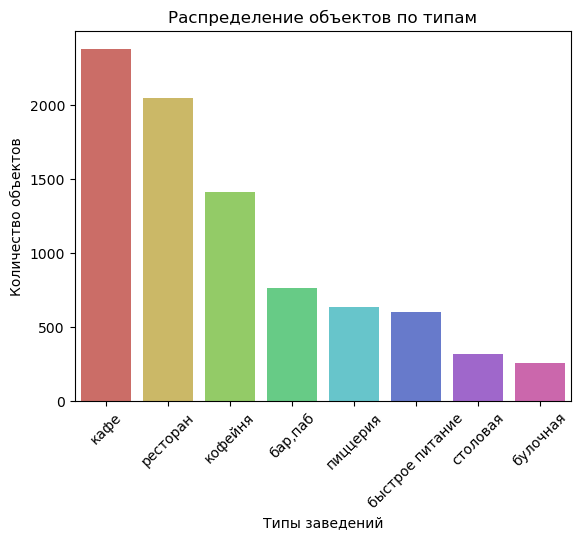

In [15]:
print(data_category)

sns.barplot(data=data_category, x='category', y='name', palette='hls')
plt.title('Распределение объектов по типам')
plt.xlabel('Типы заведений')
plt.ylabel('Количество объектов')
plt.xticks(rotation = 45)
plt.show()

Тройку лидеров с большим отрывом представляют кафе, реторан и кофейня. В конце списка столовая и булочная

In [16]:
data_seats = data.groupby('category')['seats'].median().reset_index().sort_values(by='seats', ascending=False)

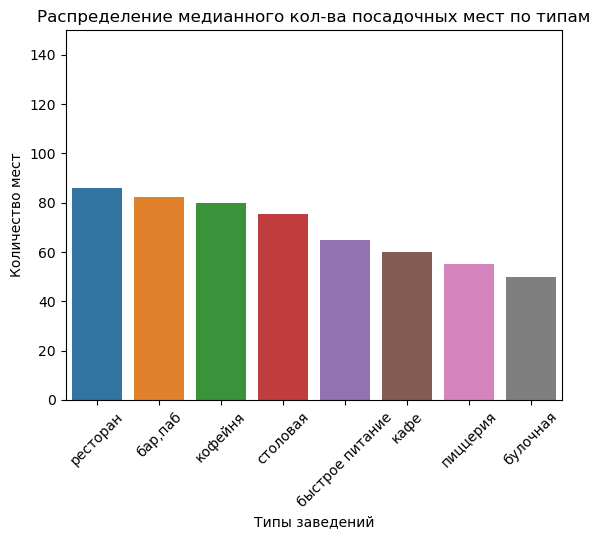

In [17]:
sns.barplot(x='category', y='seats', data=data_seats)
plt.title('Распределение медианного кол-ва посадочных мест по типам')
plt.xlabel('Типы заведений')
plt.ylabel('Количество мест')
plt.xticks(rotation = 45)
plt.ylim(0, 150)
plt.show()

Наибольшее кол-во посадочных меств ресторанах, пабах и кофейнях, замыкают список пиццерия и булочная, что не удивительно: пиццы часто заказывают на дом, булочки забирают с собой. Стоит также отметить, что наибольшее кол-во выбросов так же присуще тройке лидеров.

Рассмотрим отношение сетевых заведений к несетевым: 

In [18]:
data_chain = data.groupby('chain')['name'].count().reset_index()

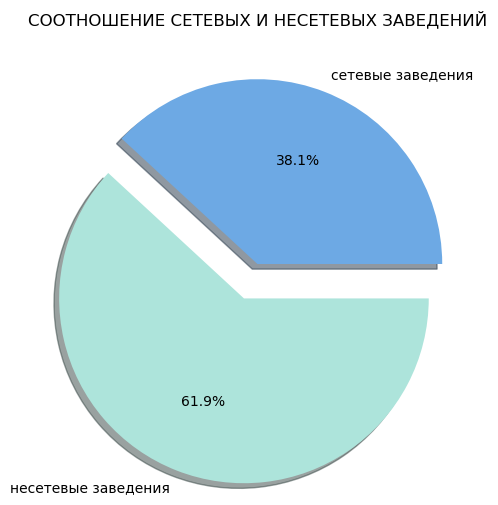

In [19]:
plt.figure(figsize=(6, 6))
colors = ['#ADE4DB', '#6DA9E4']
explode = (0.2, 0)

plt.pie(data_chain['name'],
        labels=data_chain['chain'].map({1: 'сетевые заведения', 0: 'несетевые заведения'}), 
        colors=colors,
        explode=explode, 
        autopct='%1.1f%%',
        counterclock=False, 
        shadow=True)
plt.title('СООТНОШЕНИЕ СЕТЕВЫХ И НЕСЕТЕВЫХ ЗАВЕДЕНИЙ')
plt.show()

In [20]:
data_chain

,chain,name
0,0,5201
1,1,3205


Несетевых явно больше, что неудивительно

Рассмотрим, в каких категориях общепита болше сетевых заведений и наоборот:

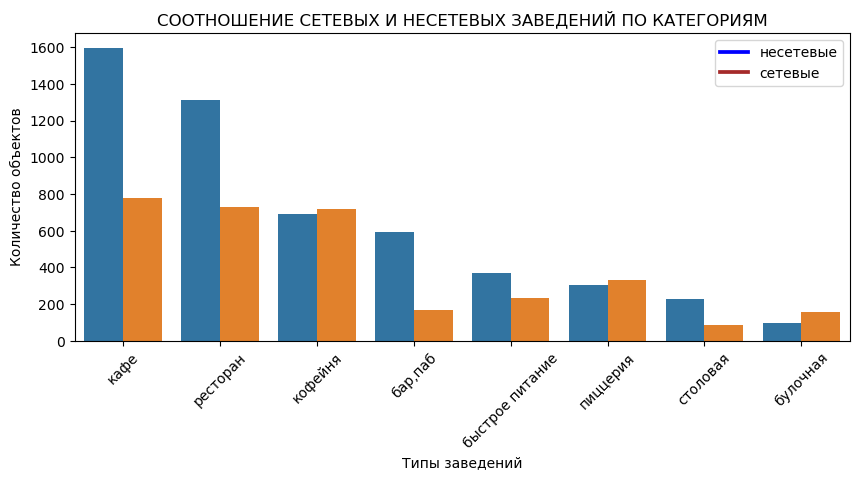

In [21]:
data_category_chain = data.groupby(['category', 'chain'])['name'].count().sort_values(ascending=False).reset_index()

plt.figure(figsize=(10, 4))
sns.barplot(x='category', y='name', hue='chain', data=data_category_chain) 
sns.set_palette('deep')
plt.xlabel('Типы заведений')
plt.ylabel('Количество объектов')
plt.title('СООТНОШЕНИЕ СЕТЕВЫХ И НЕСЕТЕВЫХ ЗАВЕДЕНИЙ ПО КАТЕГОРИЯМ')
plt.xticks(rotation = 45)
plt.legend(['несетевые', 'сетевые'])
ax = plt.gca()
leg = ax.get_legend()
leg.legendHandles[0].set_color('blue')
leg.legendHandles[1].set_color('brown')
plt.show()

Наибольшая разница между сетевыми и несетевыми заведения в случе с пабами в пользу несетевых заведений. Практически партет в случае с пиццериями и кофейними с небольшим перевесом в пользу сетевых заведений.  

Расмотрим топ 15 сетевых заведений Москвы:

In [22]:
data_15 = data.query('chain == 1').groupby(['name','category'])['rating'].\
count().sort_values(ascending=False).reset_index().head(15)


In [23]:
data_15.columns=['name','category','count']


In [24]:
data_15

,name,category,count
0,шоколадница,кофейня,119
1,домино'с пицца,пиццерия,76
2,додо пицца,пиццерия,74
3,one price coffee,кофейня,71
4,яндекс лавка,ресторан,69
5,cofix,кофейня,65
6,prime,ресторан,49
7,кофепорт,кофейня,42
8,кулинарная лавка братьев караваевых,кафе,39
9,теремок,ресторан,36


In [25]:
fig = px.bar(data_15, x='name', y='count', title='Рейтинг количества сетевых объектов')
fig.update_xaxes(tickangle=45)
fig.update_xaxes(title_text='Низвание сети') 
fig.update_yaxes(title_text='кол-во заведений') 
fig.show() 

На первом месте с большим отрвывом расположилась кофейня, на втором и третьем месте - пиццерии. Стоит отметить, что в топе 15 много сетей кофеен, а именно 6.  

Распределение объектов по административным районам: 

In [26]:
data_district = data.groupby(['district', 'category'])['rating'].count().reset_index().sort_values(by='rating', ascending=False)

In [27]:
data_district.columns=['district', 'category', 'count']

In [28]:
data_district = data.groupby(['district', 'category'])['name'].count().reset_index()
data_district_sum = data.groupby('district')['name'].count().reset_index()
data_district = data_district.merge(data_district_sum, left_on='district', right_on='district', how='inner')
data_district.columns=['district','category','count', 'sum']
data_district = data_district.sort_values(by='sum', ascending=False)

In [29]:
fig = px.bar(data_district,  x='district', y='count', color='category', title='Распределение заведений по округам')
fig.show()

Мы наблюдаем явного лидера: ЦАО, такжн можно сказать, пропорции распределения разлиныех катерорий по окгругам примерно такие же, как и вобщем случае. 

Распределенеи средних рейтингов по категориям заведений: 

In [30]:
data_rating = data.groupby('category')['rating'].mean().reset_index().sort_values(by='rating', ascending=False)

data_rating

,category,rating
0,"бар,паб",4.387712
5,пиццерия,4.301264
6,ресторан,4.290357
4,кофейня,4.277282
1,булочная,4.268359
7,столовая,4.211429
3,кафе,4.123886
2,быстрое питание,4.050249


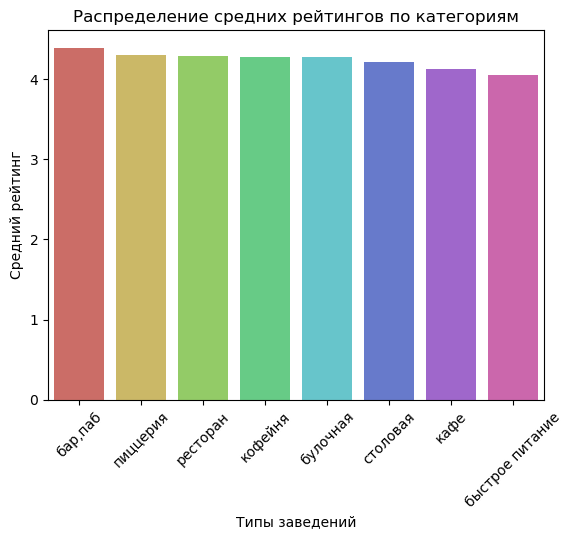

In [31]:


sns.barplot(data=data_rating, x='category', y='rating', palette='hls')
plt.title('Распределение средних рейтингов по категориям')
plt.xlabel('Типы заведений')
plt.ylabel('Средний рейтинг')
plt.xticks(rotation = 45)
plt.show()

Явных преимуществ одних категорий перед другими не наблюдается

Распределение средних рейтингов по регионам:

In [32]:
data_rating = data.groupby('district')['rating'].mean().reset_index()

data_rating

,district,rating
0,Восточный административный округ,4.174185
1,Западный административный округ,4.181551
2,Северный административный округ,4.239778
3,Северо-Восточный административный округ,4.148260
4,Северо-Западный административный округ,4.208802
5,Центральный административный округ,4.377520
6,Юго-Восточный административный округ,4.101120
7,Юго-Западный административный округ,4.172920
8,Южный административный округ,4.184417


In [33]:
with open('D:\\Практикум\\admin_level_geomap.geojson', encoding='utf-8') as file:
    geo = json.load(file)

In [34]:


# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo,
    data=data_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Явно выделяется ЦАО, на втором и третьем месте идут Западный и Северо-Западный округа. Регионом с самым низким средним рейтингом можно счтать Юго-Востоный административный округ.

Отобразим все заведения датасета на карте с помощью кластеров:

In [35]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

Наибольшее кол-во заведений ожидаемо в центре, выбрать явного победителя в остальных районах затруднительно, неравномерность распределения завдеений может быть связана с плотностью застройки в конкретном месте.

Топ-15 улиц по кол-ву заведений

In [36]:
data_street = data.groupby(['street', 'category'])['name'].count().reset_index()
data_street_total = data.groupby('street')['name'].count().reset_index()
data_street = data_street.merge(data_street_total, left_on='street', right_on='street', how='inner')
data_street.columns=['street','category','count', 'total']
data_street = data_street.sort_values(by='total', ascending=False).head(111)

In [37]:

fig = px.bar(data_street,  x='street', y='count', color='category', title='Распределение заведений по улицам')
fig.show()

Чем более оживленная проходимая или проезжаемая улица, тем больше заведений. Конечно влияет и фактор длины улицы.

Распределение среднего чека по округам: 

In [38]:
data_bill = data.groupby('district')['middle_avg_bill'].median().sort_values().reset_index()

In [39]:
data_bill

,district,middle_avg_bill
0,Юго-Восточный административный округ,450.0
1,Северо-Восточный административный округ,500.0
2,Южный административный округ,500.0
3,Восточный административный округ,575.0
4,Юго-Западный административный округ,600.0
5,Северный административный округ,650.0
6,Северо-Западный административный округ,700.0
7,Западный административный округ,1000.0
8,Центральный административный округ,1000.0


In [40]:


# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo,
    data=data_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний чек по раонам Москвы',
).add_to(m)

# выводим карту
m

В данной иллюстрации интересно то, что большого отличия от предыдущего хороплета (рейтинг по регионам) нет. 

Таким образом интересно посмотреть зависимость рейтинга от среднего чека: 

In [41]:
data_bill_rating = data.groupby('rating')['middle_avg_bill'].median().reset_index()

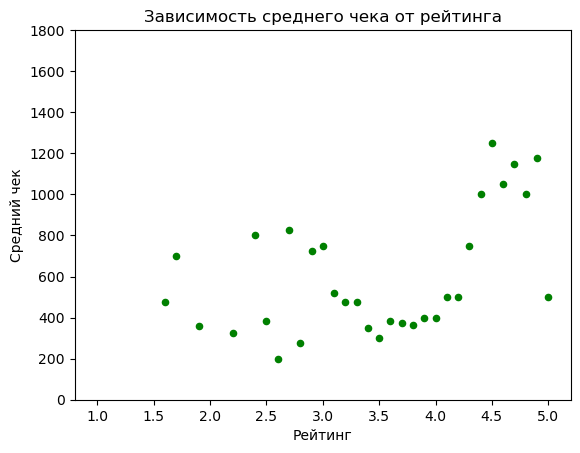

In [42]:
data_bill_rating.plot(x='rating', y='middle_avg_bill', kind='scatter', color= "green")

plt.xlabel('Рейтинг')
plt.ylabel('Средний чек')
plt.title('Зависимость среднего чека от рейтинга')
plt.ylim(0, 1800)
plt.show()

Зависомость не обнаружена

#### Вывод: 

Проанализировав полученные данные были выявлены следующие зависомости и особенности: 
 - Лидерами по количеству заведений в Москве являются кафе, реторан и кофейня;
 - Сетевых заведений 38% против 62% несетевых;
 - По категориям наибольший процент сетевых заведений у пуццерий, кофеен и булочных;
 - Самыми крупными по кол-ву подасочных мест являются рестораны, пабы и кофейни;
 - Зависости рейтинга заведения от категории и наоборот не наблюдается;
 - Район с наибоольшим кол-вом общепитов - ЦАО, с наименьшим - СЗАО, остальные - приблизительно на одном уровне. Также, район ЦАО обладает наибольшими средним рейтингом среди заведенией общественного питания, наименьший рейтинг имеет ЮВАО;
 - Наибольший средник чек за заказ распреден между ЦАО и ЗАО, наименьший - Северо-Восточный округ, Юго-Восточный округ и Южный округ;
 - Явной звисимости кол-ва заведений от расположения улицы обнаружено не было, на это могут влиять протяженноть и проходимость улицы, а также плотность застройки.   
 - Также не было обнаружно зависимости между средним чеком и рейтингом заведения.

### Исследование открытия кофейни.

Выясним, сколько всего кфеен в датасете и как они распределены по карте Москвы


In [43]:
print('Всего в Москве насчитывается', data.query('category == "кофейня"')['name'].count(), 'кофеен')

Всего в Москве насчитывается 1413 кофеен


In [44]:
data_cup = data.query('category == "кофейня"')

In [45]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data_cup.apply(create_clusters, axis=1)

# выводим карту
m

На данной карте проиллюстрировано распределение кофеен, если изучить карту, можно сделать вывод, что кофейни располагаются плотнее в густозаселенных районах, а также кофейни предпочитают размещать в торговых центрах, даже если район не является таковым. 

Рассмотрим распределение кофеен по округам: 

In [46]:
data_cup_region = data.query('category == "кофейня"').groupby('district')['name'].count()

In [47]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
region_map=Choropleth(
    geo_data=geo,
    data=data_cup_region,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Распределение плотности заведений по районам Москвы',
).add_to(m)


# выводим карту
m

Карта иллюстирирует, в каких округах нименьшая конкуренция: можно выделить СЗАО, ЮЗАО, ВАО и  ЮВАО. Каждый из этих районов имеет достотчно густозаселенных обастей.

Рассмотрим, какая доля кофеен работает круглосуточно: 

In [48]:
data_cup.groupby('is_24/7')['name'].count()

is_24/7
False    1354
True       59
Name: name, dtype: int64

Всего 59 заведений из 1354 рабоают круглосуточно, это неплохое подспорье для конкуренции в этом направлении.

In [49]:
data_cup.groupby('is_24/7')['rating'].mean()

is_24/7
False    4.280355
True     4.206780
Name: rating, dtype: float64

При этом существенных различий в в рейтингах не наблюдается.

Рассморим распределение рейтинга по округам:  

In [50]:
data_cup_region_rating = data_cup.groupby('district')['rating'].mean().reset_index()

In [51]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
region_map=Choropleth(
    geo_data=geo,
    data=data_cup_region_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний чек по раонам Москвы',
).add_to(m)


# выводим карту
m

Ниже всего средний рейтинг в Северо-Восточном и Юго-Западном округах, такм есть, что предложить.

Выясним, среднюю стоиомсть чашки кофе:

In [52]:
data_cup['middle_coffee_cup'].mean()

175.0556621880998

Посмотрим, как меняется средняя стоимость по округам: 

In [53]:
data_cup_price = data_cup.groupby('district')['middle_coffee_cup'].mean().sort_values(ascending=False).reset_index()

In [54]:
fig = px.bar(data_cup_price, x='district', y='middle_coffee_cup', title='Рейтинг количества сетевых объектов')
fig.update_xaxes(tickangle=45)
fig.update_xaxes(title_text='Низвание сети') 
fig.update_yaxes(title_text='кол-во заведений') 
fig.show() 

Западный округ - низкий рейтинг и самый высокий прайс, Юго-ВОсточный округ самый низкий прайс с более высоким рейтингом. 

### Вывод: 
Исходя из представленных данных и промежуточных выводов, я бы порекомендовал открыть кофейноню в следующих местах:


In [55]:
# сохраняем координаты Большого театра в переменные
p1_lat, p1_lng = 55.676943, 37.753156

# создаём карту с центром в точке расположения Большого театра и начальным зумом 17
m = folium.Map(location=[p1_lat, p1_lng], zoom_start=17)
# создаём маркер в точке расположения Большого театра
marker = folium.Marker([p1_lat, p1_lng])
# добавляем маркер на карту
marker.add_to(m)

# выводим карту
m

Юго-Восточный округ, район Люблино. Густонаселенная территория, мало конкурентов, невысокий прайс за чашку кофе скорее всего свидетельствует о менее дорогостоящей аренде помещения. Невысогие рейтинги по району в целом. 

In [56]:
p2_lat, p2_lng = 55.661270, 37.593357

# создаём карту с центром в точке расположения Большого театра и начальным зумом 17
m = folium.Map(location=[p2_lat, p2_lng], zoom_start=17)
# создаём маркер в точке расположения Большого театра
marker = folium.Marker([p2_lat, p2_lng])
# добавляем маркер на карту
marker.add_to(m)

# выводим карту
m

Юго-Западный округ, жилой комплекс "Нахимово" и его окрестности. Практически полное отсутвие конкуренции, несамые низкие средние рейтинги округа могут быть погрешностью небольшого кол-ва заведений. 

In [57]:


p3_lat, p3_lng = 55.775995, 37.484702

# создаём карту с центром в точке расположения Большого театра и начальным зумом 17
m = folium.Map(location=[p3_lat, p3_lng], zoom_start=17)
# создаём маркер в точке расположения Большого театра
marker = folium.Marker([p3_lat, p3_lng])
# добавляем маркер на карту
marker.add_to(m)

# выводим карту
m

СЗАО, район "Мневники". Большой и комфртабельный район, малое кол-во конкурентов, близость. Самый высокий средний прайс скорее всего обусловлен дорогой недвижемостью и арендой вокруг, однако, это свидетельствует и о платежеспособности местных жителей. 

Презентация: https://drive.google.com/file/d/1P_5ozCWgpo7agNgjNyHLs4vJHcNgM_lT/view?usp=sharing